# **Relationship Between Venue Categories and Income in Districts of the City of São Paulo, Brazil**
---

### Applied Data Science Capstone - IBM/Coursera

### Table of contents

* [Introduction](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Results](#results)
* [Discussion](#discussion)
* [Conclusion](#conclusion)

## Introduction <a name="introduction"></a>

The objective of this project is to discover the relationship between venue categories and income to help entrepreneurs choosing a location to open a business.

Do some venue types appear more in higher or income areas? If yes, which ones? We will try to answer this question applying data science to help stakeholders achieve their goals.

**Note:** if the maps are not showing you can try to download and open the HTML version of this notebook.

The first thing to do is import all the libraries we will use:

In [28]:
import requests
from IPython import display

# data processing and visualization
import numpy as np
import pandas as pd
import matplotlib as mpl
%matplotlib inline
import matplotlib.pyplot as plt
# geodata and mapping
import geopandas
import geocoder
import folium
import folium.plugins
# modeling
from sklearn.cluster import KMeans
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from kneed import KneeLocator
import shap

## Data <a name="data"></a>

To try to answer the question, we will gather the following data:
* Geographic data to help with gathering and visualizing other information, coming from [IBGE](https://www.ibge.gov.br/en/home-eng.html) (Brazilian Institute of Geography and Statistics)
* Something similar to _per capita income_ of the districts, which can be found on the [population census](https://www.ibge.gov.br/en/statistics/social/income-expenditure-and-consumption/18391-2010-population-census.html?=&t=o-que-e) of IBGE.
* Categories and location of venues across the city using the [Foursquare API](https://developer.foursquare.com/places)

### Geographic data

This will be used to create our map visualizations and also to calculate the centroids, the point "in the middle" of each district, so we can use that with the Foursquare API to get the venues around the point.

In [3]:
census = geopandas.read_file('../data/censo-distritos/sp-distritos/35DSE250GC_SIR.shp')

In [5]:
census.head()

,ID,CD_GEOCODD,NM_DISTRIT,geometry
0,3629,350010505,ADAMANTINA,"POLYGON ((-51.09093 -21.47214, -51.09062 -21.4..."
1,3630,350020405,ADOLFO,"POLYGON ((-49.69668 -21.34430, -49.69641 -21.3..."
2,3631,350030305,AGUAÍ,"POLYGON ((-47.01254 -22.00527, -47.01219 -22.0..."
3,3632,350040205,ÁGUAS DA PRATA,"POLYGON ((-46.69034 -21.87624, -46.68824 -21.8..."
4,3633,350040210,SÃO ROQUE DA FARTURA,"POLYGON ((-46.69034 -21.87624, -46.72304 -21.8..."


In [7]:
census.shape

(1036, 4)

This shapefile contains data for all districts in the state. To select only the 96 from the city of São Paulo:

In [8]:
census_districts = census[census['CD_GEOCODD'].str.startswith('3550308')].reset_index(drop=True)

In [10]:
census_districts.head()

,ID,CD_GEOCODD,NM_DISTRIT,geometry
0,4459,355030801,ÁGUA RASA,"POLYGON ((-46.58166 -23.55215, -46.58166 -23.5..."
1,4460,355030802,ALTO DE PINHEIROS,"POLYGON ((-46.71422 -23.53528, -46.71322 -23.5..."
2,4461,355030803,ANHANGUERA,"POLYGON ((-46.82425 -23.40326, -46.82401 -23.4..."
3,4462,355030804,ARICANDUVA,"POLYGON ((-46.51892 -23.55685, -46.51880 -23.5..."
4,4463,355030805,ARTUR ALVIM,"POLYGON ((-46.47575 -23.52400, -46.47510 -23.5..."


In [12]:
census_districts.shape

(96, 4)

One thing that we will have to pay attention is the coordinate reference system (CRS) our data is in. To plot maps we will have to convert our data to [EPSG:4326](https://epsg.io/4326), the same coordinate system used by GPS.

In [13]:
census_districts.crs

<Geographic 2D CRS: EPSG:4674>
Name: SIRGAS 2000
Axis Info [ellipsoidal]:
- lon[east]: Longitude (Degree)
- lat[north]: Latitude (Degree)
Area of Use:
- undefined
Datum: SIRGAS2000
- Ellipsoid: Geodetic_Reference_System_of_1980
- Prime Meridian: Greenwich

In [14]:
census_districts = census_districts.to_crs(epsg='4326')

In [15]:
census_districts.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Now let's verify that it is working

In [16]:
# Get the latitude and longitude values for the city of São Paulo
g = geocoder.osm('São Paulo, SP, Brasil')
sp_latlng = g.latlng
sp_latlng

[-23.5506507, -46.6333824]

In [19]:
# create a GeoJSON object for folium
gjson_census = census_districts.to_json()

# create the map
sp_census_map = folium.Map(sp_latlng,
                           zoom_start=11)

# add the GeoJSON layer
folium.GeoJson(gjson_census).add_to(sp_census_map)

In [20]:
# display the map
sp_census_map

To calculate the centroids we need to convert from latitude and longitude values to cartesian coordinates. Then we convert back.

In [21]:
census_districts['centroids'] = census_districts['geometry'].to_crs(epsg=3395).centroid.to_crs(epsg=4326)

In [22]:
census_districts.head()['centroids']

0    POINT (-46.57185 -23.56688)
1    POINT (-46.71188 -23.54758)
2    POINT (-46.79294 -23.43047)
3    POINT (-46.51568 -23.57393)
4    POINT (-46.48583 -23.54021)
Name: centroids, dtype: geometry

In [23]:
for name, point in zip(census_districts['NM_DISTRIT'],
                          census_districts['centroids']):
    lat = point.y
    lng = point.x
    label = folium.Popup(name)
    folium.Marker([lat, lng], popup=label).add_to(sp_census_map)
    #folium.Circle([lat, lng], radius=2000, color='#02040F', weight=2, popup=label).add_to(sp_census_map)

In [24]:
sp_census_map

Looks alright. Next we can join this with the income from the census.

### Census data

Let's load the data and take a look:

In [30]:
census_sp_df = pd.read_csv(
    '../data/censo2010/SP_Capital_20190823/Base informaçoes setores2010 universo SP_Capital/CSV/Basico_SP1.csv',
    encoding='iso-8859-1',
    sep=';',
    decimal=',')

In [31]:
census_sp_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18363 entries, 0 to 18362
Data columns (total 34 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Cod_setor            18363 non-null  int64  
 1   Cod_Grandes Regiões  18363 non-null  int64  
 2   Nome_Grande_Regiao   18363 non-null  object 
 3   Cod_UF               18363 non-null  int64  
 4   Nome_da_UF           18363 non-null  object 
 5   Cod_meso             18363 non-null  int64  
 6   Nome_da_meso         18363 non-null  object 
 7   Cod_micro            18363 non-null  int64  
 8   Nome_da_micro        18363 non-null  object 
 9   Cod_RM               18363 non-null  int64  
 10  Nome_da_RM           18363 non-null  object 
 11  Cod_municipio        18363 non-null  int64  
 12  Nome_do_municipio    18363 non-null  object 
 13  Cod_distrito         18363 non-null  int64  
 14  Nome_do_distrito     18363 non-null  object 
 15  Cod_subdistrito      18363 non-null 

In [32]:
with pd.option_context('display.max_columns', None):
    display.display(census_sp_df.head())

,Cod_setor,Cod_Grandes Regiões,Nome_Grande_Regiao,Cod_UF,Nome_da_UF,Cod_meso,Nome_da_meso,Cod_micro,Nome_da_micro,Cod_RM,Nome_da_RM,Cod_municipio,Nome_do_municipio,Cod_distrito,Nome_do_distrito,Cod_subdistrito,Nome_do_subdistrito,Cod_bairro,Nome_do_bairro,Situacao_setor,Tipo_setor,V001,V002,V003,V004,V005,V006,V007,V008,V009,V010,V011,V012,Unnamed: 33
0,355030801000001,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,RM São Paulo,3550308,SÃO PAULO,355030801,ÁGUA RASA,35503080100,ÁGUA RASA,3550308000,SÃO PAULO (todos os setores),1,0,266.0,800.0,3.01,2.32,2091.32,8532451.78,2164.55,8673276.78,1227.41,4285771.99,1713.75,5152087.86,NaN
1,355030801000002,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,RM São Paulo,3550308,SÃO PAULO,355030801,ÁGUA RASA,35503080100,ÁGUA RASA,3550308000,SÃO PAULO (todos os setores),1,0,306.0,913.0,2.98,2.09,1650.09,3983441.31,1717.44,4030519.99,1045.78,2572133.32,1468.08,2991546.94,NaN
2,355030801000003,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,RM São Paulo,3550308,SÃO PAULO,355030801,ÁGUA RASA,35503080100,ÁGUA RASA,3550308000,SÃO PAULO (todos os setores),1,0,189.0,625.0,3.31,3.08,1280.43,5474593.06,2349.53,7553913.02,902.97,2735492.52,1786.79,3837674.74,NaN
3,355030801000004,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,RM São Paulo,3550308,SÃO PAULO,355030801,ÁGUA RASA,35503080100,ÁGUA RASA,3550308000,SÃO PAULO (todos os setores),1,0,181.0,572.0,3.16,2.26,1119.59,3572955.10,1859.13,4567289.50,869.09,2122409.02,1567.41,2735383.24,NaN
4,355030801000005,3,Região Sudeste,35,São Paulo,3515,Metropolitana de São Paulo,35061,São Paulo,20,RM São Paulo,3550308,SÃO PAULO,355030801,ÁGUA RASA,35503080100,ÁGUA RASA,3550308000,SÃO PAULO (todos os setores),1,0,240.0,754.0,3.14,2.35,1416.90,2240207.58,1581.66,2240109.39,917.71,1570047.75,1356.35,1725877.85,NaN


We can see that we got a lot of rows and columns. This is because the various statistics were calculated for the census sector, which is a lot smaller than the district. We can see the number of sectors per district:

In [21]:
census_sp_df['Nome_do_distrito'].nunique()

96

In [22]:
census_sp_df['Nome_do_distrito'].value_counts()

GRAJAÚ           609
CAPÃO REDONDO    414
JABAQUARA        407
JARDIM ÂNGELA    406
SAPOPEMBA        381
                ... 
MARSILAC          45
SÉ                43
JAGUARA           34
BARRA FUNDA       32
PARI              28
Name: Nome_do_distrito, Length: 96, dtype: int64

And we are only interested in the income, which is the `V009` column that represents the “Value of the average nominal monthly income of persons aged 10 and over (with and without income)” (from the census documentation).

In [23]:
census_sp_df['V009'].describe()

count    18363.000000
mean      1413.447912
std       1515.485910
min          0.000000
25%        549.415000
50%        817.350000
75%       1619.335000
max      30825.930000
Name: V009, dtype: float64

So we will group by the district name and take the mean:

In [43]:
sp_income = pd.DataFrame(census_sp_df.groupby('Nome_do_distrito')['V009'].mean())
sp_income.rename(columns={'V009': 'Average income'}, inplace=True)
print(sp_income.shape)
sp_income.head()

(96, 1)


,Average income
Nome_do_distrito,
ALTO DE PINHEIROS,4309.551667
ANHANGUERA,600.476636
ARICANDUVA,883.293952
ARTUR ALVIM,853.139060
BARRA FUNDA,2744.018437


In [44]:
sp_income.describe()

,Average income
count,96.000000
mean,1576.818001
std,1210.528426
min,396.483333
25%,712.579332
50%,1104.387729
75%,2090.890415
max,5402.808125


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


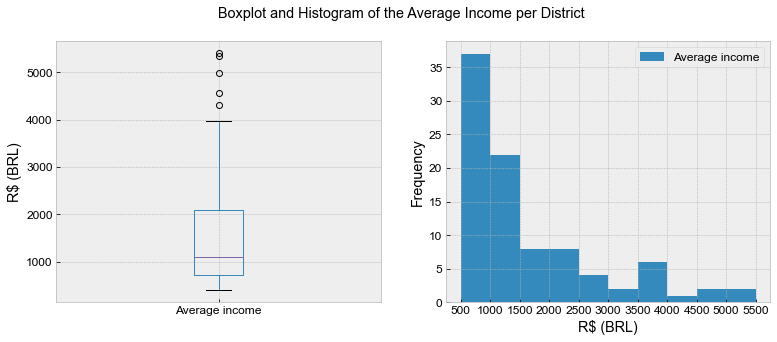

In [45]:
with mpl.rc_context(rc={'font.size': 12, 'font.family': 'Arial'}):
    with plt.style.context('bmh'):
        fig, axs = plt.subplots(1, 2, figsize=(12.8, 4.8))

        # boxplot
        sp_income.plot.box(ax=axs[0])
        axs[0].set_ylabel('R$ (BRL)')

        # histogram
        bins = range(500, 6000, 500)
        sp_income.plot.hist(bins=bins, ax=axs[1])
        axs[1].set_xticks(bins)
        axs[1].set_xlabel('R$ (BRL)')

        fig.suptitle('Boxplot and Histogram of the Average Income per District')
        plt.savefig('../report/figures/plot_income.eps', bbox_inches='tight', dpi=300)
        plt.show()
        plt.close()

In [46]:
sorted(census_districts['NM_DISTRIT'].tolist()) == sorted(sp_income.index.tolist())

True

In [49]:
bins = list(sp_income['Average income'].quantile([0, 0.25, 0.5, 0.75, 1]))

sp_income_map = folium.Map(sp_latlng,
                           zoom_start=11)

folium.Choropleth(
    geo_data=gjson_census,
    data=sp_income['Average income'],
    key_on='feature.properties.NM_DISTRIT',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.3,
    legend_name='Mean income (R$)',
    name='Income',
    bins=bins,
    reset=True
).add_to(sp_income_map)

folium.LayerControl().add_to(sp_income_map)

In [50]:
sp_income_map

In [33]:
sp_data = sp_income.copy()
sp_data['Latitude'] = census_districts.set_index('NM_DISTRIT')['centroids'].y
sp_data['Longitude'] = census_districts.set_index('NM_DISTRIT')['centroids'].x
sp_data.reset_index(inplace=True)
sp_data.rename(columns={'Nome_do_distrito': 'District', 'V009': 'Mean_income'}, inplace=True)
sp_data.head()

,District,Mean_income,Latitude,Longitude
0,ALTO DE PINHEIROS,4309.551667,-23.547577,-46.711885
1,ANHANGUERA,600.476636,-23.430474,-46.792943
2,ARICANDUVA,883.293952,-23.573926,-46.515679
3,ARTUR ALVIM,853.139060,-23.540213,-46.485832
4,BARRA FUNDA,2744.018437,-23.521253,-46.673917


### **3.1 Getting venue data**

The next step is to use the foursquare api to get the venue information from the neighborhoods we got. There is one sensitive cell below with the credentials and api version.

In [34]:
# Foursquare api credentials
CLIENT_ID = 'A034LD1DEXOC0WBSQY5A3I5T5T3HVMKIAPJCQ0DBWLIZURLL'
CLIENT_SECRET = 'KAQJMCDB2TBILDX44TVDTAMPCEB2ZISGGCWY4CKUODOTH1HC'
VERSION = '20180604'

Let's try using it for only one neighbour to check the information that comes back.

In [38]:
def getNearbyVenues(names, latitudes, longitudes, radius=500, limit=100):
    """Helper function to get venues for given latitude and longitude coordinates"""
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            limit)
            
        # make the GET request
        #try:
        results = requests.get(url).json()["response"]['groups'][0]['items']
            #print(name)
        #except:
            #print(f'\tERROR: {name}')
            #continue
            
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['District', 
                  'District Latitude', 
                  'District Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [39]:
sp_venues = pd.read_csv('../data/sp_venues2k.csv')

In [40]:
print(sp_venues.shape)
sp_venues.head()

(8036, 7)


,District,District Latitude,District Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,ALTO DE PINHEIROS,-23.547577,-46.711885,Praça Provincia De Saitama,-23.542958,-46.712119,Dog Run
1,ALTO DE PINHEIROS,-23.547577,-46.711885,Circuito das Árvores,-23.547558,-46.718146,Trail
2,ALTO DE PINHEIROS,-23.547577,-46.711885,Super Saudável,-23.543412,-46.711239,Health Food Store
3,ALTO DE PINHEIROS,-23.547577,-46.711885,St. Marché,-23.542781,-46.711423,Supermarket
4,ALTO DE PINHEIROS,-23.547577,-46.711885,Run & Fun,-23.546322,-46.718254,Bike Shop


### **3.2 Analysing neighborhoods**

With one hot encoding we can get only the category for each venue

In [43]:
## one hot encoding
sp_onehot = pd.get_dummies(sp_venues[['Venue Category']], prefix="", prefix_sep="")

# fix the neighborhood column in the dataframe
sp_onehot.insert(0, 'District', sp_venues['District'])

sp_onehot.head()

,District,Acai House,Accessories Store,Adult Boutique,Airport,Airport Lounge,Airport Service,American Restaurant,Amphitheater,Aquarium,...,Video Store,Vietnamese Restaurant,Warehouse Store,Water Park,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,ALTO DE PINHEIROS,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,ALTO DE PINHEIROS,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,ALTO DE PINHEIROS,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,ALTO DE PINHEIROS,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,ALTO DE PINHEIROS,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [44]:
sp_onehot.shape

(8036, 363)

This way we can see the total number of venues by category

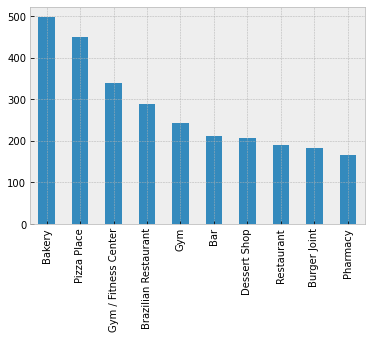

In [45]:
# total number of venues
with plt.style.context('bmh'):
    sp_onehot.groupby('District').sum().sum().sort_values(ascending=False).head(10).plot.bar()
    plt.savefig('../report/figures/stat_top_venues.eps')
    plt.show()

By grouping this data by neighborhood using the mean, we get the frequency of each category in the neighborhood to compare it with the others

In [46]:
sp_grouped = sp_onehot.groupby('District').mean().reset_index()

In [47]:
sp_grouped.head()

,District,Acai House,Accessories Store,Adult Boutique,Airport,Airport Lounge,Airport Service,American Restaurant,Amphitheater,Aquarium,...,Video Store,Vietnamese Restaurant,Warehouse Store,Water Park,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,ALTO DE PINHEIROS,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.00
1,ANHANGUERA,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00
2,ARICANDUVA,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00
3,ARTUR ALVIM,0.0,0.01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00
4,BARRA FUNDA,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.01


Then we use this data to generate a dataframe with the most common venues for each neighborhood

In [48]:
# most common venues
def sort_venue_frequency(row, n_top_venues):
    row_categories = row.iloc[1:]
    row_sorted = row_categories.sort_values(ascending=False)
    return row_sorted.index.values[0:n_top_venues]

In [49]:
n_top_venues = 10

indicators = ['st', 'nd', 'rd']
# create columns according to number of top venues
columns = ['District']
for ind in np.arange(n_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

venue_freq_sorted = pd.DataFrame(columns=columns)
venue_freq_sorted['District'] = sp_grouped['District']

for i in range(sp_grouped.shape[0]):
    venue_freq_sorted.iloc[i, 1:] = sort_venue_frequency(sp_grouped.iloc[i, :], n_top_venues)

In [50]:
venue_freq_sorted.head()

,District,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,ALTO DE PINHEIROS,Plaza,Dog Run,Park,Restaurant,Athletics & Sports,Pizza Place,Gym / Fitness Center,Clothing Store,Beer Bar,Cosmetics Shop
1,ANHANGUERA,Pizza Place,Bakery,Gym / Fitness Center,Grocery Store,Park,Lake,Campground,Supermarket,Convenience Store,Burger Joint
2,ARICANDUVA,Bakery,Pizza Place,Sandwich Place,Italian Restaurant,Gym / Fitness Center,Gym,Department Store,Supermarket,Burger Joint,Pet Store
3,ARTUR ALVIM,Pizza Place,Bakery,Gym / Fitness Center,Chocolate Shop,Market,Department Store,Café,Clothing Store,Italian Restaurant,Fast Food Restaurant
4,BARRA FUNDA,Pet Store,Brazilian Restaurant,Music Venue,Motel,Soccer Stadium,Dessert Shop,Theater,Bar,Italian Restaurant,Hotel


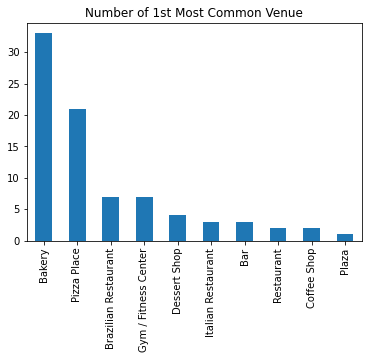

In [51]:
venue_freq_sorted['1st Most Common Venue'].value_counts().head(10).plot.bar()
plt.title('Number of 1st Most Common Venue')
plt.show()

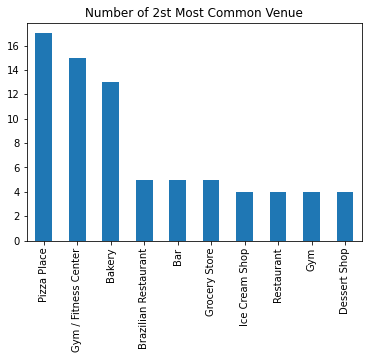

In [52]:
venue_freq_sorted['2nd Most Common Venue'].value_counts().head(10).plot.bar()
plt.title('Number of 2st Most Common Venue')
plt.show()

Some types of venues seem to appear a lot in the same borough, like coffee shops (I guess people really like coffee) and restaurants. Some types of retail businesses benefit from clustering together to catch customers. Others seem to be apart from each other, even if the city has a good number of them, like hotels.

### **3.3 Clustering**

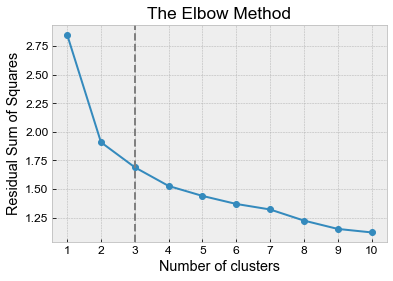

In [53]:
sp_grouped_clustering = sp_grouped.set_index('District')

rss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(sp_grouped_clustering)
    rss.append(kmeans.inertia_)
    
kl = KneeLocator(
    range(1, 11), rss, curve='convex', direction='decreasing'
)
    
with mpl.rc_context(rc={'font.size': 12, 'font.family': 'Arial'}):
    with plt.style.context('bmh'):
        plt.plot(range(1, 11), rss, 'o-')
        plt.title('The Elbow Method')
        plt.xlabel('Number of clusters')
        plt.ylabel('Residual Sum of Squares')
        plt.xticks(range(1, 11))
        plt.axvline(kl.elbow, ls='--', color='grey')
        plt.savefig('../report/figures/plot_elbow.eps', bbox_inches='tight', dpi=300)
        plt.show()

The elbow method didn't give me satisfactory results, so I've decided to go with five clusters

In [54]:
kclusters = 3

kmeans = KMeans(n_clusters=kclusters, random_state=42)
kmeans.fit(sp_grouped_clustering)
kmeans.labels_[0: 10]

array([0, 1, 1, 1, 0, 0, 0, 0, 1, 0], dtype=int32)

We can insert this clustering information in the dataframe

In [55]:
venue_freq_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

sp_merged = sp_data

sp_merged = sp_merged.join(venue_freq_sorted.set_index('District'), on='District')
# we have to drop nan's because some neighborhoods doesn't have venues or the foursquare api doesn't return one
sp_merged.dropna(inplace=True)
sp_merged['Cluster Labels'] = sp_merged['Cluster Labels'].astype(np.int64)

sp_merged.head()

,District,Mean_income,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,ALTO DE PINHEIROS,4309.551667,-23.547577,-46.711885,0,Plaza,Dog Run,Park,Restaurant,Athletics & Sports,Pizza Place,Gym / Fitness Center,Clothing Store,Beer Bar,Cosmetics Shop
1,ANHANGUERA,600.476636,-23.430474,-46.792943,1,Pizza Place,Bakery,Gym / Fitness Center,Grocery Store,Park,Lake,Campground,Supermarket,Convenience Store,Burger Joint
2,ARICANDUVA,883.293952,-23.573926,-46.515679,1,Bakery,Pizza Place,Sandwich Place,Italian Restaurant,Gym / Fitness Center,Gym,Department Store,Supermarket,Burger Joint,Pet Store
3,ARTUR ALVIM,853.139060,-23.540213,-46.485832,1,Pizza Place,Bakery,Gym / Fitness Center,Chocolate Shop,Market,Department Store,Café,Clothing Store,Italian Restaurant,Fast Food Restaurant
4,BARRA FUNDA,2744.018437,-23.521253,-46.673917,0,Pet Store,Brazilian Restaurant,Music Venue,Motel,Soccer Stadium,Dessert Shop,Theater,Bar,Italian Restaurant,Hotel


In [56]:
sp_merged['Cluster Labels'].value_counts()

1    55
0    40
2     1
Name: Cluster Labels, dtype: int64

There is one large cluster and the others are very small. Let's visualize them in the map

In [57]:
from matplotlib import cm
from matplotlib import colors
# create map
map_clusters = folium.Map(location=[lat, lng], zoom_start=10)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.viridis(np.linspace(0, 1, len(ys)))
viridis = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lng, district, cluster in zip(sp_merged['Latitude'],
                                  sp_merged['Longitude'],
                                  sp_merged['District'],
                                  sp_merged['Cluster Labels']):
    label = folium.Popup(str(district) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=4,
        popup=label,
        stroke=True,
        color='black',
        weight=1.5,
        fill=True,
        fill_color=viridis[cluster-1],
        fill_opacity=1).add_to(map_clusters)
    
map_clusters

In [58]:
markers_colors = []
for lat, lng, district, cluster in zip(sp_merged['Latitude'],
                                  sp_merged['Longitude'],
                                  sp_merged['District'],
                                  sp_merged['Cluster Labels']):
    label = folium.Popup(str(district) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=4,
        popup=label,
        stroke=True,
        color='black',
        weight=1.5,
        fill=True,
        fill_color=viridis[cluster-1],
        fill_opacity=1).add_to(sp_income_map)
    
sp_income_map

#### **Cluster 0**

In [59]:
sp_merged.loc[sp_merged['Cluster Labels'] == 0, sp_merged.columns[[1] + list(range(5, sp_merged.shape[1]))]].head()

,Mean_income,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,4309.551667,Plaza,Dog Run,Park,Restaurant,Athletics & Sports,Pizza Place,Gym / Fitness Center,Clothing Store,Beer Bar,Cosmetics Shop
4,2744.018437,Pet Store,Brazilian Restaurant,Music Venue,Motel,Soccer Stadium,Dessert Shop,Theater,Bar,Italian Restaurant,Hotel
5,2777.620141,Coffee Shop,Gym / Fitness Center,Ice Cream Shop,Brazilian Restaurant,Hotel,Bakery,Italian Restaurant,Sushi Restaurant,Pizza Place,Dive Bar
6,1564.359103,Pizza Place,Bar,Brazilian Restaurant,Steakhouse,Churrascaria,Bakery,Pet Store,Gym,Ice Cream Shop,Flower Shop
7,1171.859000,Brazilian Restaurant,Middle Eastern Restaurant,Korean Restaurant,Theater,Women's Store,Peruvian Restaurant,Bar,Art Museum,Restaurant,Café


#### **Cluster 1**

In [60]:
sp_merged.loc[sp_merged['Cluster Labels'] == 1, sp_merged.columns[[1] + list(range(5, sp_merged.shape[1]))]].head()

,Mean_income,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,600.476636,Pizza Place,Bakery,Gym / Fitness Center,Grocery Store,Park,Lake,Campground,Supermarket,Convenience Store,Burger Joint
2,883.293952,Bakery,Pizza Place,Sandwich Place,Italian Restaurant,Gym / Fitness Center,Gym,Department Store,Supermarket,Burger Joint,Pet Store
3,853.139060,Pizza Place,Bakery,Gym / Fitness Center,Chocolate Shop,Market,Department Store,Café,Clothing Store,Italian Restaurant,Fast Food Restaurant
8,588.049676,Bakery,Gym / Fitness Center,Gym,Pet Store,Dessert Shop,Pedestrian Plaza,Burger Joint,Big Box Store,Market,Pharmacy
11,797.515806,Bakery,Grocery Store,Brazilian Restaurant,Gym,Pet Store,Pharmacy,Bar,Gym / Fitness Center,Farmers Market,Sandwich Place


#### **Cluster 2**

In [61]:
sp_merged.loc[sp_merged['Cluster Labels'] == 2, sp_merged.columns[[1] + list(range(5, sp_merged.shape[1]))]].head()

,Mean_income,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
50,396.483333,Brazilian Restaurant,Forest,Fish Taverna,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck


In [62]:
sp_merged.head()

,District,Mean_income,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,ALTO DE PINHEIROS,4309.551667,-23.547577,-46.711885,0,Plaza,Dog Run,Park,Restaurant,Athletics & Sports,Pizza Place,Gym / Fitness Center,Clothing Store,Beer Bar,Cosmetics Shop
1,ANHANGUERA,600.476636,-23.430474,-46.792943,1,Pizza Place,Bakery,Gym / Fitness Center,Grocery Store,Park,Lake,Campground,Supermarket,Convenience Store,Burger Joint
2,ARICANDUVA,883.293952,-23.573926,-46.515679,1,Bakery,Pizza Place,Sandwich Place,Italian Restaurant,Gym / Fitness Center,Gym,Department Store,Supermarket,Burger Joint,Pet Store
3,ARTUR ALVIM,853.139060,-23.540213,-46.485832,1,Pizza Place,Bakery,Gym / Fitness Center,Chocolate Shop,Market,Department Store,Café,Clothing Store,Italian Restaurant,Fast Food Restaurant
4,BARRA FUNDA,2744.018437,-23.521253,-46.673917,0,Pet Store,Brazilian Restaurant,Music Venue,Motel,Soccer Stadium,Dessert Shop,Theater,Bar,Italian Restaurant,Hotel


In [63]:
sp_merged['Mean_income'].describe()

count      96.000000
mean     1576.818001
std      1210.528426
min       396.483333
25%       712.579332
50%      1104.387729
75%      2090.890415
max      5402.808125
Name: Mean_income, dtype: float64

In [64]:
sp_merged.loc[sp_merged['Cluster Labels'].eq(0)]['Mean_income'].describe()

count      40.000000
mean     2503.616272
std      1339.891224
min       506.222386
25%      1420.253399
50%      2227.590181
75%      3576.956446
max      5402.808125
Name: Mean_income, dtype: float64

In [65]:
sp_merged.loc[sp_merged['Cluster Labels'].eq(1)]['Mean_income'].describe()

count      55.000000
mean      924.243525
std       430.775564
min       486.370769
25%       632.621823
50%       796.000826
75%      1095.473058
max      2715.873571
Name: Mean_income, dtype: float64

In [66]:
sp_merged.loc[sp_merged['Cluster Labels'].eq(2)]['Mean_income'].describe()

count      1.000000
mean     396.483333
std             NaN
min      396.483333
25%      396.483333
50%      396.483333
75%      396.483333
max      396.483333
Name: Mean_income, dtype: float64

In [67]:
sp_merged.loc[sp_merged['Cluster Labels'] == 0]['1st Most Common Venue'].value_counts()

Pizza Place                  9
Brazilian Restaurant         5
Dessert Shop                 4
Italian Restaurant           3
Coffee Shop                  2
Bar                          2
Gym / Fitness Center         2
Sports Club                  1
Theater                      1
Plaza                        1
Japanese Restaurant          1
Market                       1
Middle Eastern Restaurant    1
Ice Cream Shop               1
Burger Joint                 1
Churrascaria                 1
Pet Store                    1
Park                         1
Soccer Stadium               1
Grocery Store                1
Name: 1st Most Common Venue, dtype: int64

In [68]:
sp_merged.loc[sp_merged['Cluster Labels'] == 1]['1st Most Common Venue'].value_counts()

Bakery                  33
Pizza Place             12
Gym / Fitness Center     5
Restaurant               2
Brazilian Restaurant     1
Pharmacy                 1
Bar                      1
Name: 1st Most Common Venue, dtype: int64

In [69]:
X = sp_grouped_clustering

In [70]:
y = sp_data.set_index('District')['Mean_income']

In [72]:
lasso = Lasso(random_state=42)

In [73]:
lasso.fit(X, y)

Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=42,
      selection='cyclic', tol=0.0001, warm_start=False)

In [75]:
lasso_score = cross_validate(lasso, X, y, scoring=['r2', 'neg_mean_absolute_error', 'neg_root_mean_squared_error'])

In [76]:
print('R²: {:.2f} ({:.2f}), MAE: {:.2f} ({:.2f}), RMSE: {:.2f} ({:.2f})'.format(
    lasso_score['test_r2'].mean(),
    lasso_score['test_r2'].std(),
    - lasso_score['test_neg_mean_absolute_error'].mean(),
    lasso_score['test_neg_mean_absolute_error'].std(),
    - lasso_score['test_neg_root_mean_squared_error'].mean(),
    lasso_score['test_neg_root_mean_squared_error'].std()
))

R²: 0.53 (0.19), MAE: 615.64 (246.96), RMSE: 810.12 (340.22)


In [77]:
rf = RandomForestRegressor(random_state=42)

In [78]:
rf.fit(X, y)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=42, verbose=0, warm_start=False)

In [80]:
rf_score = cross_validate(rf, X, y, scoring=['r2', 'neg_mean_absolute_error', 'neg_root_mean_squared_error'])

In [81]:
print('R²: {:.2f} ({:.2f}), MAE: {:.2f} ({:.2f}), RMSE: {:.2f} ({:.2f})'.format(
    rf_score['test_r2'].mean(),
    rf_score['test_r2'].std(),
    - rf_score['test_neg_mean_absolute_error'].mean(),
    rf_score['test_neg_mean_absolute_error'].std(),
    - rf_score['test_neg_root_mean_squared_error'].mean(),
    rf_score['test_neg_root_mean_squared_error'].std()
))

R²: 0.58 (0.15), MAE: 566.73 (176.02), RMSE: 752.67 (228.38)


In [82]:
rf_ex = shap.TreeExplainer(rf)

In [83]:
shap_values = rf_ex.shap_values(X)

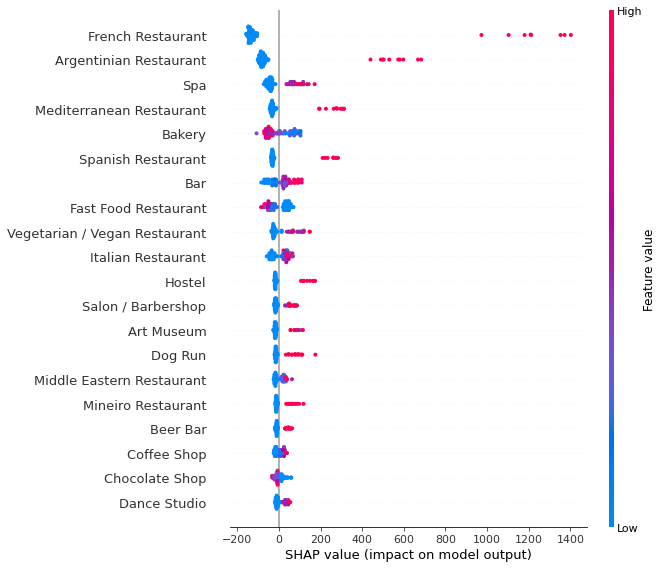

In [84]:
shap.summary_plot(shap_values, X, show=False)
plt.savefig('../report/figures/plot_rf_shap.eps', bbox_inches='tight', dpi=300)